In [1]:
%load_ext autoreload

%autoreload 2

In [2]:
import math
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow, imread, imsave, figure
import pandas as pd
import numpy as np
import os
import sys
from skimage.color import rgb2gray
from skimage.transform import rescale, resize


#Keras:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import LearningRateScheduler
from keras.optimizers import SGD
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler

#Custom Functions:
ROOT_DIR = os.path.abspath("../")
sys.path.append(ROOT_DIR)

from imports.utils.log_progress import log_progress
from imports.utils.visualization import Visualize
from imports.utils.enums import DATA_BASE_PATH, SHAPE
from imports.models.u_net import get_unet
from imports.utils.utils import rle_encode, rle_decode

DATA_IMAGE_PATH = DATA_BASE_PATH + '/Images'
DATA_MASK_PATH = DATA_BASE_PATH + '/Masks'

Using TensorFlow backend.


In [3]:
import warnings
warnings.filterwarnings("ignore")

### load existing Model:

In [4]:
from imports.models.losses import bce_dice_loss, dice_coeff
from keras.models import load_model, model_from_json

import keras.losses
keras.losses.custom_loss = bce_dice_loss

model = load_model('../saved_models/unet/unet1024_80epochs_circle.h5', custom_objects={'bce_dice_loss': bce_dice_loss,'dice_coeff':dice_coeff})
model2 = load_model('../saved_models/unet/unet1024_60epochs.h5', custom_objects={'bce_dice_loss': bce_dice_loss,'dice_coeff':dice_coeff})

# 2. Visualize

### 2.1 Show Samples of trained Model:

In [5]:
train_df = pd.read_pickle(DATA_BASE_PATH+'/new_train_df')
val_df = pd.read_pickle(DATA_BASE_PATH+'/new_val_df')
test_df = pd.read_pickle(DATA_BASE_PATH+'/new_test_df')

print("Number of training Samples:", len(train_df))
print("Number of validation Samples:", len(val_df))
print("Number of test Samples:", len(test_df))

Number of training Samples: 354
Number of validation Samples: 102
Number of test Samples: 51


In [52]:
val_df.sample(5)

,image_path,mask_path,mask_cirlce_path,name,dataset,mask_rle,mask_circle_rle,roots,splines
82,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1427.png,None,2282 36 2319 1 2334 132 3819 182 5355 182 6892...,2140 861 6748 861 11356 861 15961 867 20569 86...,"[[816.885635447437, 158.8427268124281], [856.1...","[[[788.8574832319721, 352.8617979286536], [796..."
2,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1139.png,None,2411 57 3946 59 5480 61 7015 63 8551 64 10086 ...,555592 81 560173 135 564763 171 569356 201 573...,"[[1387.1908253692438, 960.9877151668584], [890...","[[[1321.5614109470025, 962.5469495972383], [12..."
64,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1500.png,None,2769 51 4304 53 5839 54 7374 55 8909 56 10445 ...,3517 135 8107 171 12700 201 17296 225 21892 24...,"[[792.1821470026063, 586.0468363636364], [1194...","[[[606.9680375325803, 994.4396387571921], [644..."
97,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1180.png,None,228129 3 229661 7 231196 8 232732 8 234267 9 2...,1020694 81 1025275 135 1029865 171 1034458 201...,"[[788.790580712424, 374.70180897583424], [522....","[[[661.8692948740226, 290.6752736478711], [737..."
46,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1058.png,None,464500 1 466031 11 467566 14 469101 17 470636 ...,23719 81 28300 135 32890 171 37483 201 42079 2...,"[[718.7545855777585, 427.3871392405063], [949....","[[[686.9115662901825, 652.3544009205983], [696..."


In [7]:
vis_params = {'data_set':'all',
              'model':model}

visualize = Visualize(**vis_params)

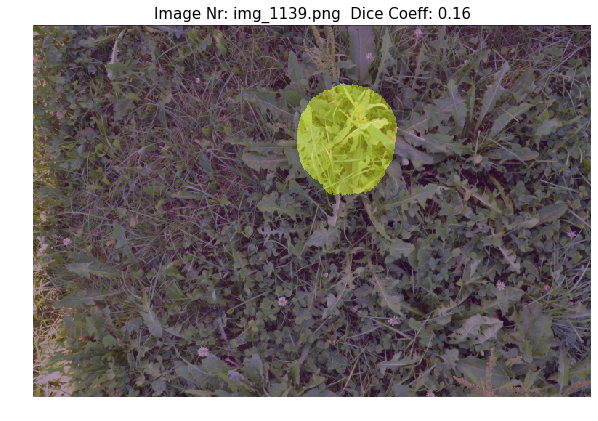

In [55]:
visualize.show_single(index='1139',mode='image_prediction')

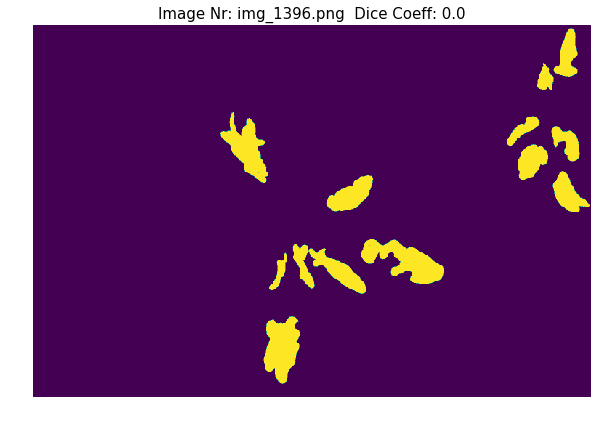

In [10]:
visualize.show_single(index='random',mode='mask')

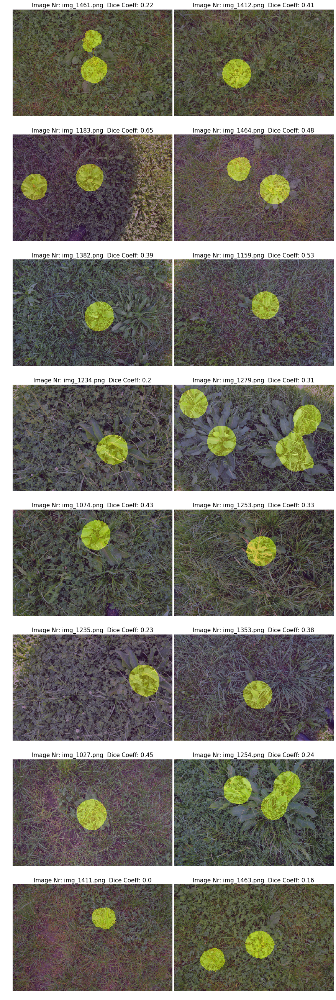

In [62]:
visualize.show_matrix(index='random',mode='image_prediction',rows=8)

### Segment the predicted Masks using watershed-segmentation:

In [20]:
im = visualize.get_image(1255)
pred = visualize.get_prediction(1255)

Text(0.5,1,'Separated objects')

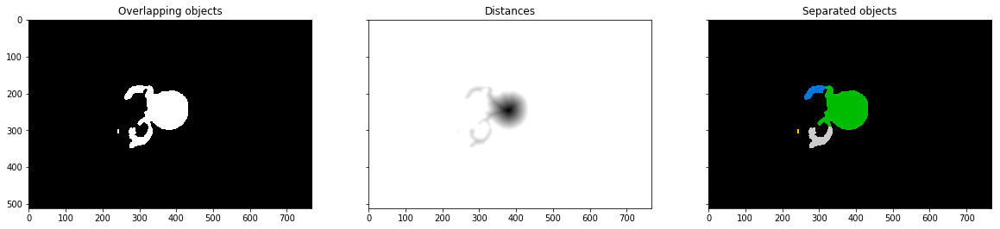

In [46]:
# http://scikit-image.org/docs/dev/auto_examples/segmentation/plot_watershed.html

def watershed_segmentation(prediction_image,threshold=0.90,footprint_size=(40,40)):
    from scipy import ndimage as ndi
    from skimage.morphology import watershed
    from skimage.feature import peak_local_max
    from skimage.draw import circle
    circle_img = np.zeros(footprint_size, dtype=np.uint8)
    rr, cc = circle(footprint_size[0]/2, footprint_size[1]/2,min(footprint_size)/2-2)
    circle_img[rr, cc] = 1
    
    # Now we want to separate the two objects in image
    # Generate the markers as local maxima of the distance to the background
    pred_logical = prediction_image>threshold
    distance = ndi.distance_transform_edt(pred_logical)
    local_maxi = peak_local_max(distance, indices=False, footprint=circle_img, labels=pred_logical)
    markers = ndi.label(local_maxi)[0]
    labels = watershed(-distance, markers, mask=pred_logical)
    
    return distance, labels

distance, labels = watershed_segmentation(pred,footprint_size=(60,60))

fig, axes = plt.subplots(ncols=3, figsize=(20, 20), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(pred, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray, interpolation='nearest')
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title('Separated objects')

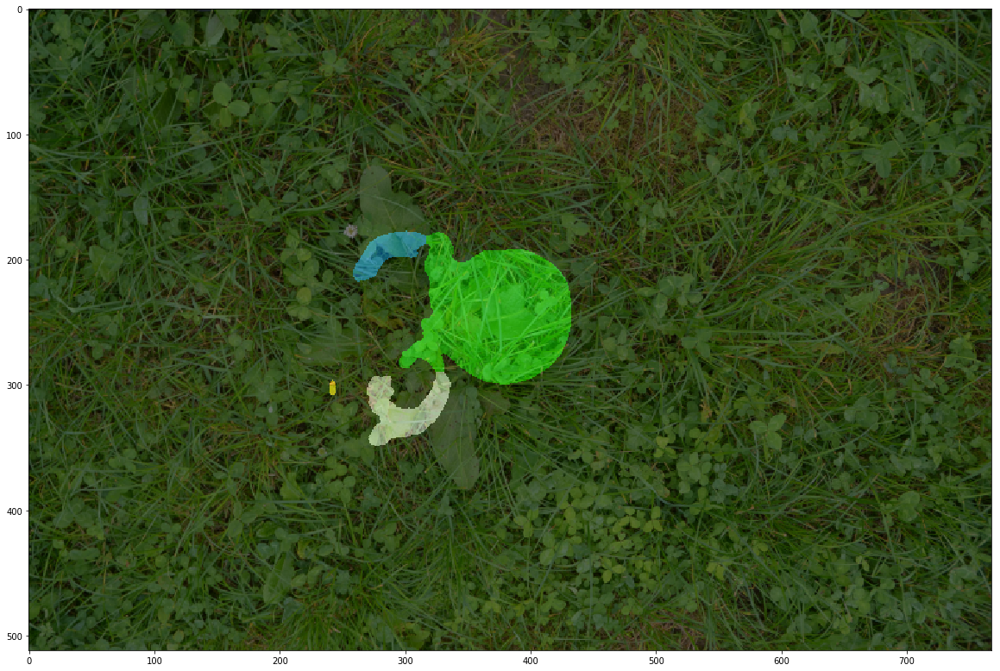

In [47]:
plt.figure(figsize=(20,20))
imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest')
imshow(im,alpha=0.5)

In [77]:
visualize.get_data_set()

'val'

In [43]:
val_df.sample(3)

,image_path,mask_path,mask_cirlce_path,name,dataset,mask_rle,mask_circle_rle,roots,splines
4,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1303.png,None,311069 1 312601 10 314136 12 315670 16 317205 ...,1209715 81 1214296 135 1218886 171 1223479 201...,"[[43.9538432667245, 787.1992929804372], [557.4...","[[[125.43599652476097, 897.3142315304948], [83..."
100,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1076.png,None,223544 1 225075 7 226610 10 228144 13 229679 1...,1113319 81 1117900 135 1122490 171 1127083 201...,"[[753.0407923544744, 587.5838085155351], [943....","[[[661.6812205039096, 719.3651848101265], [688..."
3,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1260.png,None,467520 3 469053 9 470588 11 472123 13 473658 1...,1618912 81 1623493 135 1628083 171 1632676 201...,"[[514.6208528236317, 504.8766600690448], [468....","[[[207.8953980886186, 426.69646950517836], [27..."


In [21]:
vis_params = {'data_set':'all',
              'model':model}

visualize1 = Visualize(**vis_params)

vis_params = {'data_set':'all',
              'model':model2}

visualize2 = Visualize(**vis_params)

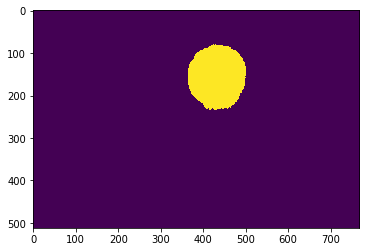

In [56]:
#1493
#1366
index = 1139
pred = visualize1.get_prediction(index=index)
pred2 = visualize2.get_prediction(index=index)
img = visualize1.get_image(index=index)
imshow(pred)

In [57]:
import skimage.measure
mask = pred > 0.5
labels = skimage.measure.label(mask)
print(labels.shape, labels.dtype)
print("Unique values in labels:", np.unique(labels))

(512, 768) int64
Unique values in labels: [0 1]


In [58]:
import ipywidgets as widgets
@widgets.interact(label = list(np.unique(labels)))
def f(label):
    print(f"The connected component with label {label} contains {np.sum(labels == label)} pixels")
    plt.imshow(labels == label)

interactive(children=(Dropdown(description='label', options=(0, 1), value=0), Output()), _dom_classes=('widget…

In [59]:
regions = skimage.measure.regionprops(labels)
large_regions = [r for r in regions if r.area > 2000]
print(f"There are {len(large_regions)} large regions")
regions[0]

There are 1 large regions


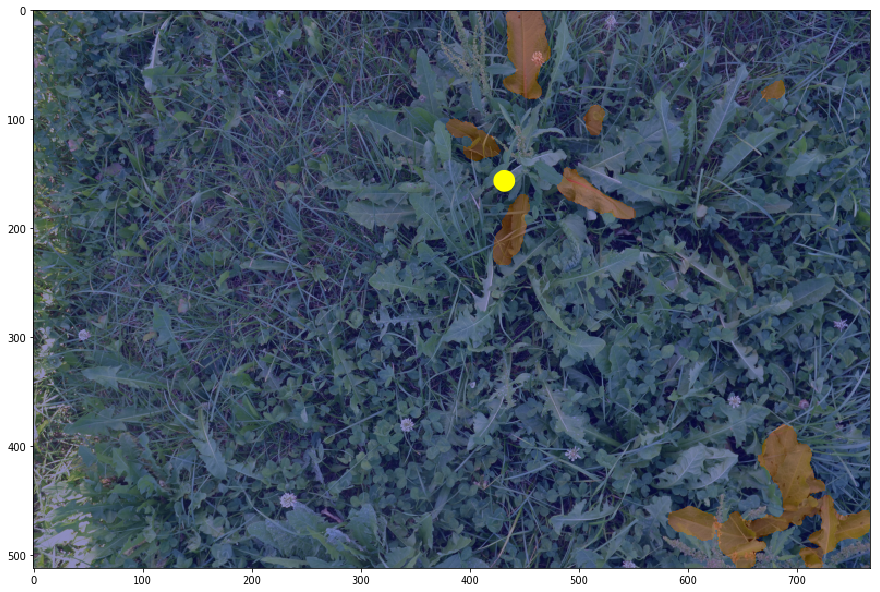

In [61]:
import matplotlib.patches as patches
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(img, cmap="gray")
ax.imshow(pred2,cmap='jet',alpha=0.4)
rects = []
circs = []
for r in large_regions:
    (min_row, min_col, max_row, max_col) = r.bbox
    (c_row,c_col) = r.centroid
    width = max_col - min_col
    height = max_row - min_row
    rect = patches.Rectangle((min_col,min_row),width,height,
                            linewidth=4,edgecolor='b',facecolor='None')
    circ = patches.Circle((c_col,c_row),10,facecolor='yellow')
    #ax.add_patch(rect)
    ax.add_patch(circ)
    rects.append(rect)
    circs.append(circ)

In [149]:
def overlap(r1, r2):
    '''Overlapping rectangles overlap both horizontally & vertically
    '''
    r1_left = r1.get_x()
    r1_right = r1.get_x()+r1.get_width()
    r2_left = r2.get_x()
    r2_right = r2.get_x()+r2.get_width()
    r1_bottom = r1.get_y()+r1.get_height()
    r1_top = r1.get_y()
    r2_bottom = r2.get_y()+r2.get_height()
    r2_top = r2.get_y()
    
    # Overlap horizontally OR vertically
    
    return range_overlap(r1_left, r1_right, r2_left, r2_right) or range_overlap(r1_bottom,r1_top,r2_bottom,r2_top)
    #return range_overlap(r1.left, r1.right, r2.left, r2.right) and range_overlap(r1.bottom, r1.top, r2.bottom, r2.top)

def range_overlap(a_min, a_max, b_min, b_max):
    '''Neither range is completely greater than the other
    '''
    return not ((a_min > b_max) or (b_min > a_max))

def combine_rects(r1,r2):
    x = min(r1.get_x(),r2.get_x())
    y = min(r1.get_y(),r2.get_y())
    width = max(r1.get_width(),r2.get_width())
    height = max(r1.get_height(),r2.get_height())
    rnew = patches.Rectangle((x,y),width,height,linewidth=4,edgecolor='g',facecolor='none')
    return rnew

In [33]:
rectsnew = []
for i in range(4):
    for j in range(4):
        if i != j:
            if overlap(rects[j],rects[i]) == True:
                rectsnew.append(combine_rects(rects[j],rects[i]))
            print(overlap(rects[j],rects[i]))

True


IndexError: list index out of range

In [34]:
for i in rectsnew:
    print(i)

Rectangle(xy=(298, 114), width=336, height=362, angle=0)


In [35]:
n = 4
bbox = np.zeros((n,4))
for i in range(n):
    bbox[i,0] = rects[i].get_x()
    bbox[i,1] = rects[i].get_y()
    bbox[i,2] = rects[i].get_x() + rects[i].get_width()
    bbox[i,3] = rects[i].get_y() + rects[i].get_height()

IndexError: list index out of range

In [36]:
bbox

array([[298., 114., 634., 476.],
       [335., 136., 409., 197.],
       [  0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.]])

#### Eigenvector Test:

In [37]:
#Eigenvector Test:
tmp = pred>0.9
y, x = np.nonzero(tmp)
x = x - np.mean(x)
y = y - np.mean(y)
coords = np.vstack([x, y])
cov = np.cov(coords)
evals, evecs = np.linalg.eig(cov)
sort_indices = np.argsort(evals)[::-1]
x_v1, y_v1 = evecs[:, sort_indices[0]]  # Eigenvector with largest eigenvalue
x_v2, y_v2 = evecs[:, sort_indices[1]]


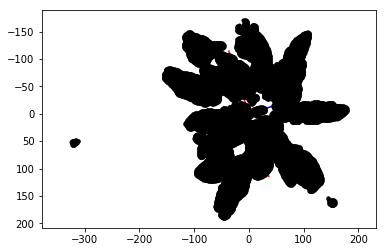

In [38]:
scale = 60
plt.plot([x_v1*-scale*2, x_v1*scale*2],
         [y_v1*-scale*2, y_v1*scale*2], color='red')
plt.plot([x_v2*-scale, x_v2*scale],
         [y_v2*-scale, y_v2*scale], color='blue')
plt.plot(x, y, 'k.')
plt.axis('equal')
plt.gca().invert_yaxis()  # Match the image system with origin at top left
plt.show()